In [1]:
import numpy as np
from sklearn.datasets import load_iris, load_digits
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import umap as umap
import plotnine as gg
from plotnine import *
from sklearn import preprocessing
%matplotlib inline

### importing data

In [15]:
data = pd.read_csv("/Users/habbasi/Desktop/2016_03_14_TargetID_Wagner_Schenone_BWH/similarity_matrix/combined_median_target_Drug_CSV/combined_normalized_variable_selected/normalized_variable_selected_drug_target.csv", encoding= "Latin-1")

### Dropping Unnamed: 0 column

In [16]:

data = data.drop(columns='Unnamed: 0', axis=1)
data.head()


,Metadata_Plate,Metadata_Well,Metadata_Plate_Map_Name,Metadata_broad_sample,Metadata_mg_per_ml,Metadata_mmoles_per_liter,Metadata_solvent,Metadata_pert_id,Metadata_pert_mfc_id,Metadata_pert_well,...,Nuclei_Texture_AngularSecondMoment_ER_10_0,Nuclei_Texture_Contrast_Mito_20_0,Nuclei_Texture_SumAverage_DNA_10_0,Nuclei_Texture_SumAverage_Mito_20_0,Nuclei_Texture_SumAverage_RNA_10_0,Nuclei_Texture_Entropy_DNA_20_0,Nuclei_RadialDistribution_MeanFrac_AGP_1of4,Nuclei_Texture_SumVariance_DNA_10_0,Nuclei_Texture_SumVariance_DNA_20_0,Nuclei_Texture_SumVariance_ER_20_0
0,SQ00015233,A01,C-7161-01-LM6-014,DMSO,0.0,0.04,DMSO,NaN,NaN,A01,...,0.338524,1.102442,-1.354616,0.167013,-0.555740,0.197759,1.270726,1.146158,1.025794,0.623312
1,SQ00015233,A02,C-7161-01-LM6-014,DMSO,0.0,0.04,DMSO,NaN,NaN,A02,...,-0.050628,1.337793,-1.665044,0.872475,-0.344415,0.562231,2.114726,0.822673,0.642281,1.108678
2,SQ00015233,A03,C-7161-01-LM6-014,DMSO,0.0,0.04,DMSO,NaN,NaN,A03,...,0.307933,-1.164991,-0.920836,-0.432641,-0.717633,0.665742,1.516386,0.646640,0.640009,0.657862
3,SQ00015233,A04,C-7161-01-LM6-014,DMSO,0.0,0.04,DMSO,NaN,NaN,A04,...,0.484886,0.238397,-0.913809,0.114976,-0.438835,-0.229661,0.450668,0.122994,0.185578,-0.343440
4,SQ00015233,A05,C-7161-01-LM6-014,DMSO,0.0,0.04,DMSO,NaN,NaN,A05,...,-0.392094,-0.433406,-0.857576,0.412739,0.032441,0.829135,0.420471,1.020376,0.663097,0.807939


### Defining new column based on samples are either Drug and Target Controls, treatments

In [17]:
data['Metadata_datatype'] = None 

data.loc[(data.Metadata_Plate_Map_Name!="C-7217-01-B80-003-A549") & (data.Metadata_broad_sample =="DMSO"), 'Metadata_datatype'] = 'Drug_DMSO'
data.loc[(data.Metadata_Plate_Map_Name!="C-7217-01-B80-003-A549") & (data.Metadata_broad_sample !="DMSO"), 'Metadata_datatype'] = 'Drug_treatments'
data.loc[(data.Metadata_Plate_Map_Name=="C-7217-01-B80-003-A549") & (data.Metadata_broad_sample =="DMSO"), 'Metadata_datatype'] = 'Target_DMSO'
data.loc[(data.Metadata_Plate_Map_Name=="C-7217-01-B80-003-A549") & (data.Metadata_broad_sample !="DMSO"), 'Metadata_datatype'] = 'Target_treatments'


### Defining variables

In [18]:
Metadata = [col for col in data.columns if "Meta" in col]
Variables = [col for col in data.columns if not "Meta" in col]


In [19]:
control_t = data[(data.Metadata_Plate_Map_Name == "C-7217-01-B80-003-A549") & (data.Metadata_broad_sample == "DMSO")]
control_d = data[(data.Metadata_Plate_Map_Name != "C-7217-01-B80-003-A549") & (data.Metadata_broad_sample == "DMSO")]

target = data[data.Metadata_Plate_Map_Name == "C-7217-01-B80-003-A549"]
drug = data[data.Metadata_Plate_Map_Name == "C-7217-01-B80-003-A549"]

## UMAP

In [26]:
import umap.umap_ as umap

embedding = umap.UMAP().fit_transform(data.loc[:, Variables])


/Users/habbasi/Library/Python/3.8/lib/python/site-packages/numba/typed_passes.py:292: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  warnings.warn(errors.NumbaPerformanceWarning(msg,


### Creating dataframe of metadata and umap embeddings

In [32]:
umap = pd.DataFrame(embedding, columns= ['UMAP-1', 'UMAP-2'])
df_umap = umap.merge(data.loc[:, Metadata], left_index=True, right_index=True)
#df_umap.to_csv("/Users/habbasi/Desktop/2016_03_14_TargetID_Wagner_Schenone_BWH/similarity_matrix/outputs/UMAP_embeddings.csv")

### Plotting

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/plotnine/ggplot.py:727: PlotnineWarning: Saving 6.4 x 4.8 in image.
  warn("Saving {0} x {1} {2} image.".format(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: /Users/habbasi/Desktop/Drug_target_UMAP.png
  warn('Filename: {}'.format(filename), PlotnineWarning)


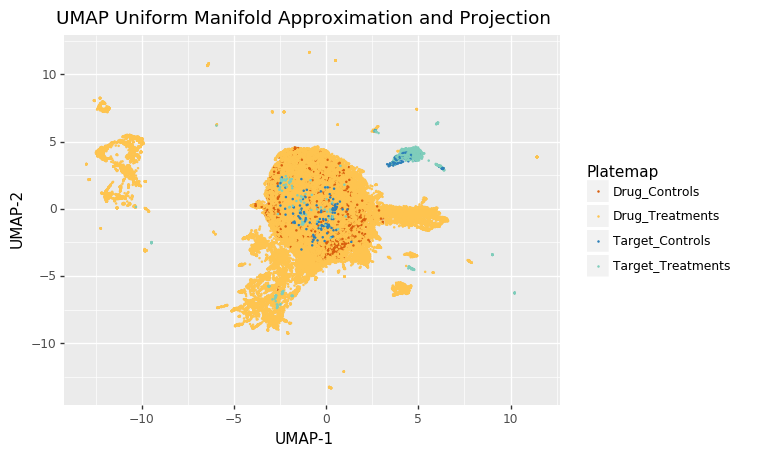

<ggplot: (320855920)>

In [28]:
p = gg.ggplot(df_umap, gg.aes(x='UMAP-1', y='UMAP-2', color= 'Metadata_datatype')) + \
    gg.geom_point(size = 0.005) + \
    gg.xlab("UMAP-1") + \
    gg.ylab("UMAP-2") + \
    gg.ggtitle("UMAP Uniform Manifold Approximation and Projection") + \
    gg.scale_colour_manual(name= "Platemap", labels=['Drug_Controls', 'Drug_Treatments', 'Target_Controls', 'Target_Treatments'], values = ["#d95f0e", "#fec44f", "#2c7fb8", "#7fcdbb"])
   


    

ggsave(filename='Drug_target_UMAP.png', plot = p, path = '/Users/habbasi/Desktop/')

p 

In [2]:
df_umap = pd.read_csv("/Users/habbasi/Desktop/2016_03_14_TargetID_Wagner_Schenone_BWH/similarity_matrix/outputs/UMAP_embeddings.csv", encoding= "Latin-1")

In [3]:
df_umap.head()

,UMAP-1,UMAP-2,Metadata_Plate,Metadata_Well,Metadata_Plate_Map_Name,Metadata_broad_sample,Metadata_mg_per_ml,Metadata_mmoles_per_liter,Metadata_solvent,Metadata_pert_id,Metadata_pert_mfc_id,Metadata_pert_well,Metadata_pert_id_vendor,Metadata_cell_id,Metadata_broad_sample_type,Metadata_pert_vehicle,Metadata_pert_type,Metadata_moa,Metadata_pert_name,Metadata_datatype
0,1.515535,-1.832411,SQ00015233,A01,C-7161-01-LM6-014,DMSO,0.0,0.04,DMSO,NaN,NaN,A01,NaN,A549,control,DMSO,control,NaN,NaN,Drug_DMSO
1,2.554429,-0.828455,SQ00015233,A02,C-7161-01-LM6-014,DMSO,0.0,0.04,DMSO,NaN,NaN,A02,NaN,A549,control,DMSO,control,NaN,NaN,Drug_DMSO
2,1.198155,-1.728067,SQ00015233,A03,C-7161-01-LM6-014,DMSO,0.0,0.04,DMSO,NaN,NaN,A03,NaN,A549,control,DMSO,control,NaN,NaN,Drug_DMSO
3,-0.275944,-1.746417,SQ00015233,A04,C-7161-01-LM6-014,DMSO,0.0,0.04,DMSO,NaN,NaN,A04,NaN,A549,control,DMSO,control,NaN,NaN,Drug_DMSO
4,1.590322,-1.324705,SQ00015233,A05,C-7161-01-LM6-014,DMSO,0.0,0.04,DMSO,NaN,NaN,A05,NaN,A549,control,DMSO,control,NaN,NaN,Drug_DMSO


In [11]:
import plotly
import chart_studio
import chart_studio.plotly as py
#chart_studio.tools.set_credentials_file(username='habbasi', api_key='90CUFlDKQLikVV3rC9Lt')

In [7]:
import plotly.express as px

fig = px.scatter(df_umap, x="UMAP-1", y="UMAP-2", color="Metadata_datatype",
                 hover_data=['Metadata_broad_sample'], title='Uniform Manifold Approximation and Projection for Dimension Reduction')
fig.update_traces(marker=dict(size=2,
#                               line=dict(width=2,
#                                         color='DarkSlateGrey')
                             ),
                  selector=dict(mode='markers'))
fig.show()


In [10]:
import plotly.offline    
plotly.offline.plot(fig, filename='figure.html',validate=False)
from IPython.display import IFrame
IFrame(src='./figure.html', width=1000, height=600)
#fig.write_html('first_figure.html', auto_open=True)

In [12]:
py.plot(fig, filename = 'UMAP-Drug_Target', auto_open=True, sharing='public')

PlotlyRequestError: This file is too big! Your current subscription is limited to 524.288 KB uploads. For more information, please visit: https://go.plot.ly/get-pricing.